In [2]:
!mkdir data
!unzip ./dataset/abstract-art-gallery.zip -d ./data

Archive:  ./dataset/abstract-art-gallery.zip
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_0.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_10.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_100.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1000.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1001.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1002.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1003.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1004.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1005.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1006.jpg  
  inflating: ./data/Abstract_gallery/Abstract_gallery/Abstract_image_1007.jpg  
  in

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision.utils import save_image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

DATA_DIR = './data'
print(os.listdir(DATA_DIR))
print(os.listdir(DATA_DIR+'/Abstract_gallery')[:10])

# Set basic parameters
batch_size = 64
num_epochs = 20
learning_rate = 1e-4

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

['Abstract_gallery', 'Abstract_gallery_2']
['Abstract_gallery']


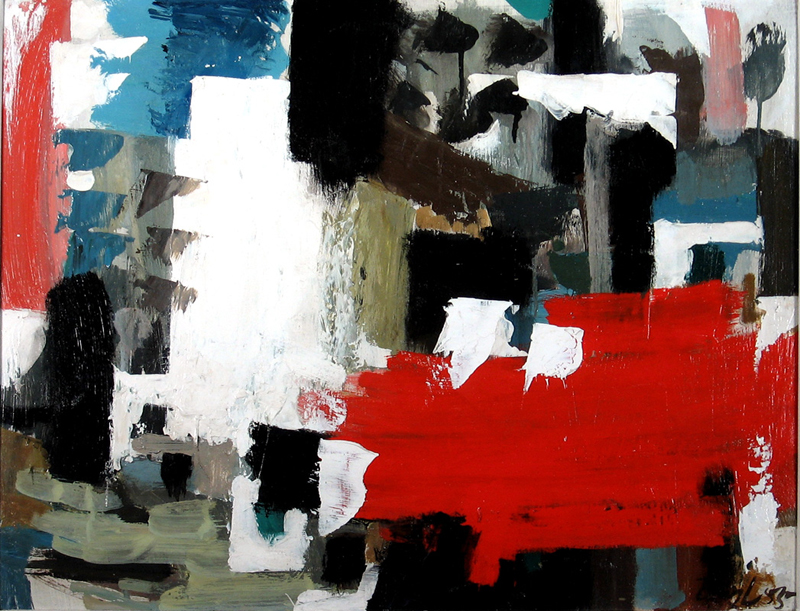

In [12]:
explore = datasets.ImageFolder(DATA_DIR)
explore[26][0]

In [5]:
image_dims = dict()
for i in range(len(explore)):
    image_dims[i] = explore[i][0].size
image_dims_df = pd.DataFrame(image_dims, index=['Width', 'Height']).transpose()
image_dims_df.head()

,Width,Height
0,1280,920
1,534,747
2,750,746
3,800,1085
4,500,434


In [6]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize((image_size,image_size)),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2)

In [7]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(16, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=16).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

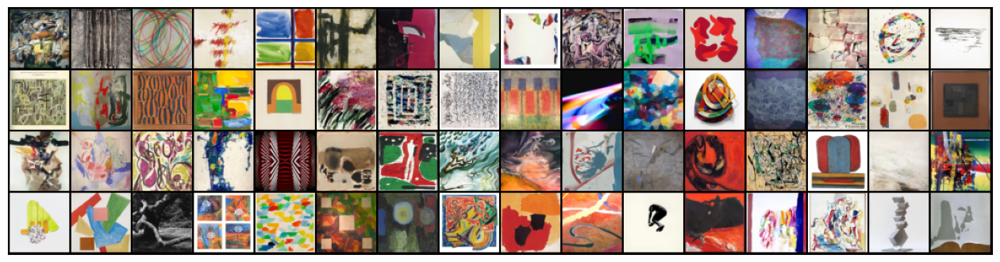

In [8]:
show_batch(train_dl)

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(64*64*3, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()  # Output a single probability
        )

    def forward(self, x):
        # Flatten the input from (batch_size, 3, 64, 64) to (batch_size, 64*64*3)
        x = x.view(x.size(0), -1)
        output = self.model(x)
        return output


class Generator(nn.Module):
    def __init__(self, z_dim=128):  # Latent dimension (z_dim) is adjustable
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(z_dim, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 4096),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(4096, 64*64*3),
            nn.Tanh()  # Output pixel values in range [-1, 1]
        )

    def forward(self, x):
        # Generate a flattened image (batch_size, 64*64*3)
        output = self.model(x)
        # Reshape to (batch_size, 3, 64, 64) for RGB images
        output = output.view(x.size(0), 3, 64, 64)
        return output

In [10]:
num_epochs = 20

discriminator = Discriminator().to(device)
generator = Generator().to(device)
criterion = nn.BCELoss()
optimizer_d = optim.Adam(discriminator.parameters(), lr=learning_rate)
optimizer_g = optim.Adam(generator.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    for i, (images, _) in enumerate(train_dl):
        images = images.to(device)
        batch_size = images.size(0)

        # Train discriminator
        optimizer_d.zero_grad()
        optimizer_g.zero_grad()
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)

        real_outputs = discriminator(images)
        d_loss_real = criterion(real_outputs, real_labels)

        noise = torch.randn(batch_size, 128).to(device)
        fake_images = generator(noise)

        fake_outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(fake_outputs, fake_labels)

        d_loss = d_loss_real + d_loss_fake

        d_loss.backward()
        optimizer_d.step()

        # Train generator
        optimizer_d.zero_grad()
        optimizer_g.zero_grad()
        fake_outputs = discriminator(fake_images)
        g_loss = criterion(fake_outputs, real_labels)
        g_loss.backward()
        optimizer_g.step()

    if (epoch + 1) % 1 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], D_loss: {d_loss.item():.4f}, G_loss: {g_loss.item():.4f}")



Epoch [1/20], D_loss: 1.0329, G_loss: 1.0639
Epoch [2/20], D_loss: 0.6433, G_loss: 3.1302
Epoch [3/20], D_loss: 0.5814, G_loss: 6.2129
Epoch [4/20], D_loss: 0.1048, G_loss: 6.6751
Epoch [5/20], D_loss: 0.0313, G_loss: 7.1346
Epoch [6/20], D_loss: 0.0353, G_loss: 7.8372
Epoch [7/20], D_loss: 0.0173, G_loss: 8.2692
Epoch [8/20], D_loss: 0.0296, G_loss: 7.8829
Epoch [9/20], D_loss: 0.0034, G_loss: 8.5859
Epoch [10/20], D_loss: 0.0165, G_loss: 8.5712
Epoch [11/20], D_loss: 0.0058, G_loss: 8.6655
Epoch [12/20], D_loss: 0.0185, G_loss: 9.1879
Epoch [13/20], D_loss: 0.0206, G_loss: 8.9022
Epoch [14/20], D_loss: 0.0155, G_loss: 9.1976
Epoch [15/20], D_loss: 0.0025, G_loss: 9.3962
Epoch [16/20], D_loss: 0.0033, G_loss: 9.6221
Epoch [17/20], D_loss: 0.0018, G_loss: 9.5555
Epoch [18/20], D_loss: 0.0068, G_loss: 9.7317
Epoch [19/20], D_loss: 0.0072, G_loss: 9.8052
Epoch [20/20], D_loss: 0.0022, G_loss: 9.8580


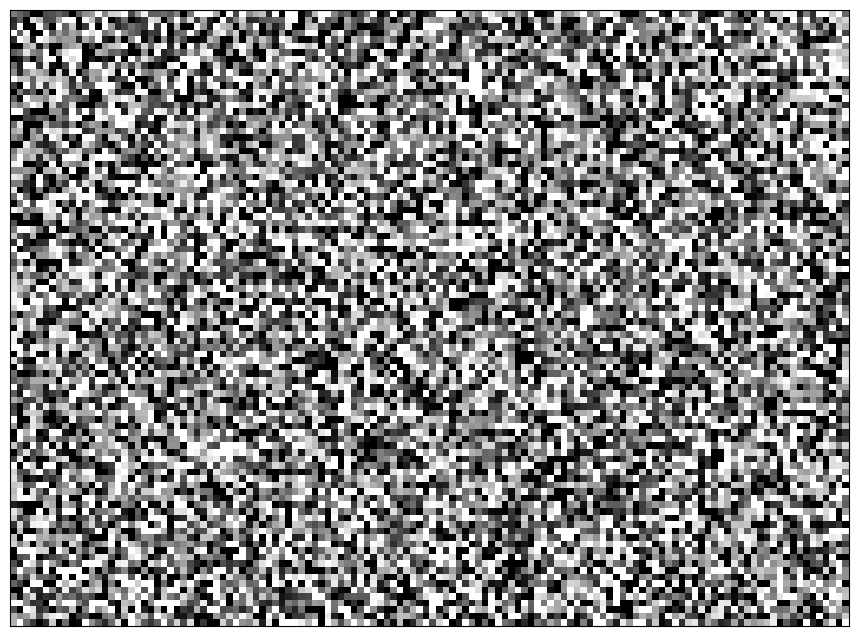

In [ ]:
# Generate and Plot Images Using Helper Functions
latent_dim = 128

# Generate random noise
noise = torch.randn(batch_size, latent_dim).to(device)

noise_a = noise.cpu()

show_images(noise_a, nmax=batch_size)

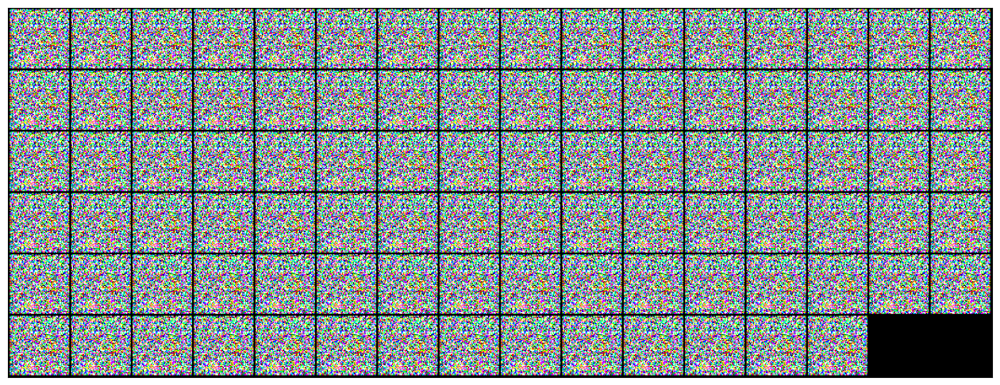

In [ ]:

# Generate images
generated_images = generator(noise)

# Move the generated images to the CPU
generated_images = generated_images.cpu()

# Use show_images to display the generated images
show_images(generated_images, nmax=batch_size)

# Replace linear layer with convolutional layer

In [ ]:
import torch.nn as nn

class DiscriminatorConv(nn.Module):
    def __init__(self):
        super(DiscriminatorConv, self).__init__()
        self.model = nn.Sequential(
            # Input: (3, 64, 64)
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),  # Output: (64, 32, 32)
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # Output: (128, 16, 16)
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # Output: (256, 8, 8)
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # Output: (512, 4, 4)
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0),  # Output: (1, 1, 1)
            nn.Sigmoid()  # Output: Single probability
        )

    def forward(self, x):
        # Input shape: (batch_size, 3, 64, 64)
        output = self.model(x)
        return output.view(-1, 1)  # Flatten the output to (batch_size, 1)


class GeneratorConv(nn.Module):
    def __init__(self, z_dim=128):
        super(GeneratorConv, self).__init__()
        self.model = nn.Sequential(
            # Input: (batch_size, z_dim, 1, 1)
            nn.ConvTranspose2d(z_dim, 512, kernel_size=4, stride=1, padding=0),  # Output: (512, 4, 4)
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # Output: (256, 8, 8)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # Output: (128, 16, 16)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # Output: (64, 32, 32)
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),  # Output: (3, 64, 64)
            nn.Tanh()  # Output pixel values in range [-1, 1]
        )

    def forward(self, x):
        # Reshape latent vector to (batch_size, z_dim, 1, 1)
        x = x.view(x.size(0), x.size(1), 1, 1)
        output = self.model(x)
        return output  # Output shape: (batch_size, 3, 64, 64)


In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv2') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
import torch.nn.functional as F

def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=16)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(16, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=16).permute(1, 2, 0))

In [ ]:
# We now fix the latent tensor to enable comparison of paintings and monitor creative growth of our model
fixed_latent = torch.randn(64, latent_dim, 1, 1, device=device)

In [ ]:
discriminator = DiscriminatorConv().to(device)
discriminator.apply(weights_init)
generator = GeneratorConv().to(device)
generator.apply(weights_init)

GeneratorConv(
  (model): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Tanh()
  )
)

Saving generated-images-0000.png


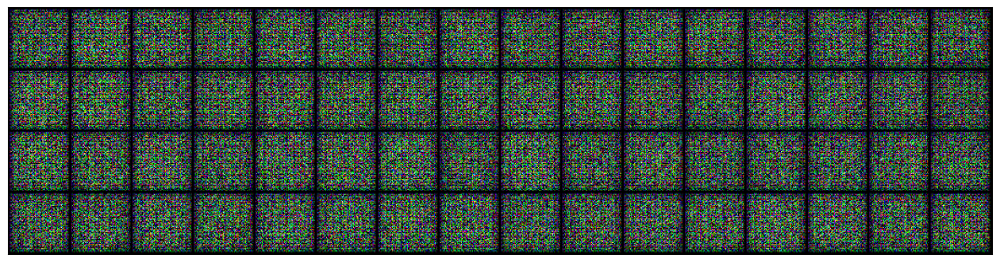

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
def fit(epochs, lr, start_idx=1):
  torch.cuda.empty_cache()

  # Losses & scores
  losses_g = []
  losses_d = []
  real_scores = []
  fake_scores = []

  # Create optimizers
  opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
  opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

  for epoch in range(epochs):
    for i, (real_images, _) in enumerate(train_dl):
      real_images = real_images.to(device)

      # Train discriminator
      loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
      # Train generator
      loss_g = train_generator(opt_g)

    # Record losses & scores
    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_scores.append(real_score)
    fake_scores.append(fake_score)

    # Log losses & scores (last batch)
    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

    # Save generated images
    save_samples(epoch+start_idx, fixed_latent, show=False)

  return losses_g, losses_d, real_scores, fake_scores

In [ ]:
criterion = nn.BCELoss()
optimizer_d = optim.Adam(discriminator.parameters(), lr=learning_rate)
optimizer_g = optim.Adam(generator.parameters(), lr=learning_rate)

num_epochs = 500

history = fit(num_epochs, learning_rate)

Epoch [1/500], loss_g: 7.1627, loss_d: 0.6759, real_score: 0.8167, fake_score: 0.3028
Saving generated-images-0001.png
Epoch [2/500], loss_g: 7.8916, loss_d: 0.2607, real_score: 0.9002, fake_score: 0.1239
Saving generated-images-0002.png
Epoch [3/500], loss_g: 15.6533, loss_d: 0.1062, real_score: 0.9135, fake_score: 0.0000
Saving generated-images-0003.png
Epoch [4/500], loss_g: 7.3500, loss_d: 0.1121, real_score: 0.9750, fake_score: 0.0800
Saving generated-images-0004.png
Epoch [5/500], loss_g: 6.0026, loss_d: 0.0867, real_score: 0.9544, fake_score: 0.0266
Saving generated-images-0005.png
Epoch [6/500], loss_g: 6.6139, loss_d: 0.0647, real_score: 0.9671, fake_score: 0.0220
Saving generated-images-0006.png
Epoch [7/500], loss_g: 7.1082, loss_d: 0.0261, real_score: 0.9900, fake_score: 0.0157
Saving generated-images-0007.png
Epoch [8/500], loss_g: 10.3926, loss_d: 0.0202, real_score: 0.9815, fake_score: 0.0008
Saving generated-images-0008.png
Epoch [9/500], loss_g: 7.4680, loss_d: 0.0053,

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
import cv2

# Video parameters
vid_fname = 'gans_training.mp4'
frame_rate = 12

# Get sorted list of frame files
files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()
print(f"Found {len(files)} frame files.")

# Read the first frame to get the resolution
if len(files) > 0:
    frame = cv2.imread(files[0])
    if frame is None:
        raise ValueError(f"Error reading the first frame: {files[0]}")
    height, width, _ = frame.shape
    print(f"Frame resolution: {width}x{height}")
else:
    raise ValueError("No frames found in the directory.")

# Define VideoWriter
out = cv2.VideoWriter(
    vid_fname,
    cv2.VideoWriter_fourcc(*'XVID'),  # Use XVID codec
    frame_rate,
    (width, height)
)

if not out.isOpened():
    raise ValueError("Failed to initialize VideoWriter. Check codec or file path.")

# Write each frame to the video
for fname in files:
    frame = cv2.imread(fname)
    if frame is None:
        print(f"Skipping corrupted or unreadable frame: {fname}")
        continue
    out.write(frame)

out.release()
print(f"High-quality video saved as {vid_fname}")

Found 501 frame files.
Frame resolution: 1058x266
High-quality video saved as gans_training.mp4


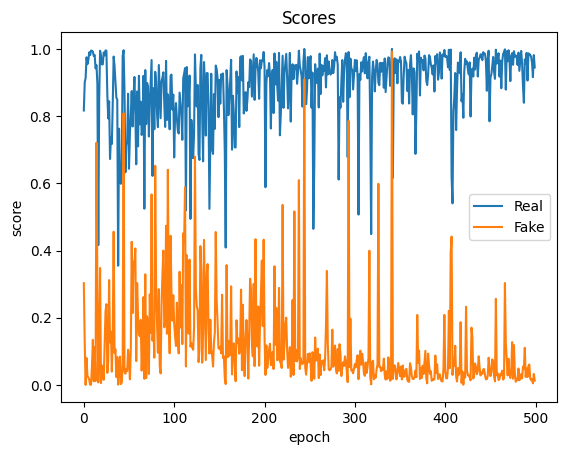

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

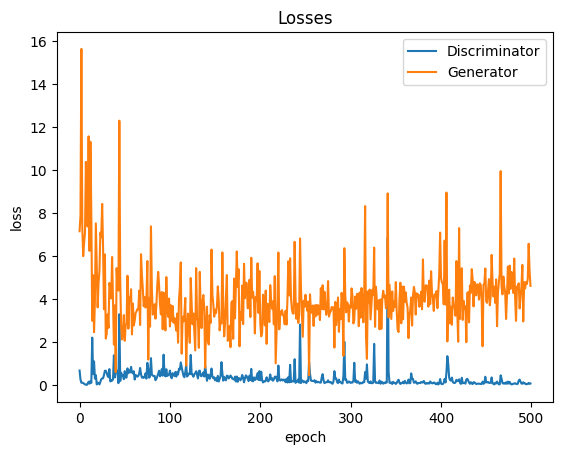

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

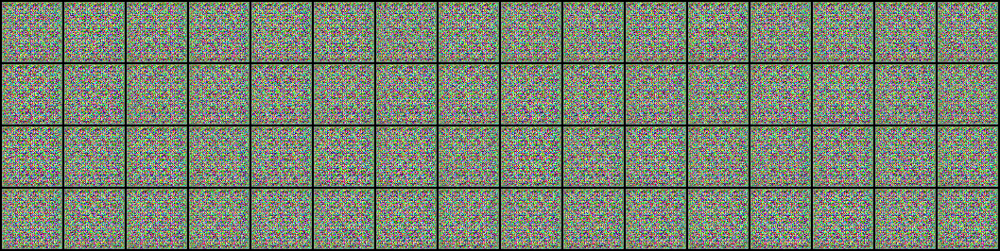

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0001.png')

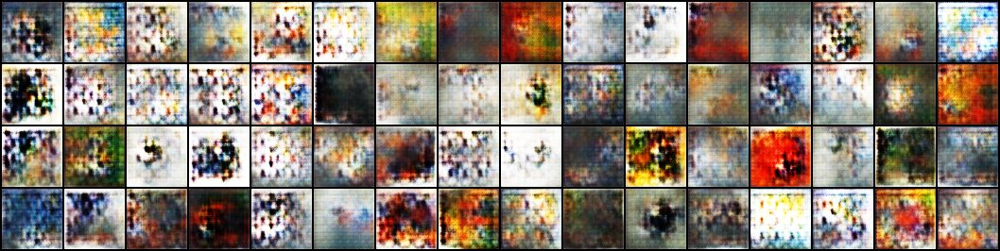

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0100.png')

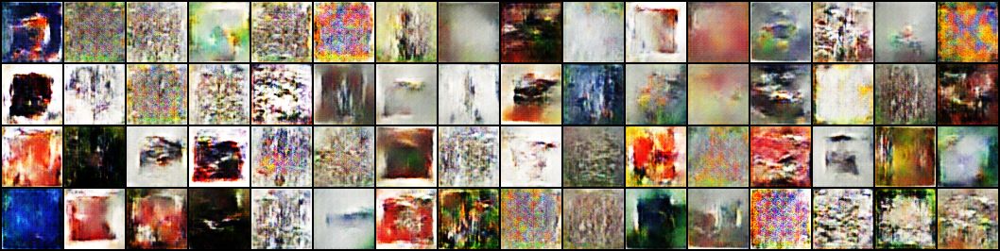

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0200.png')

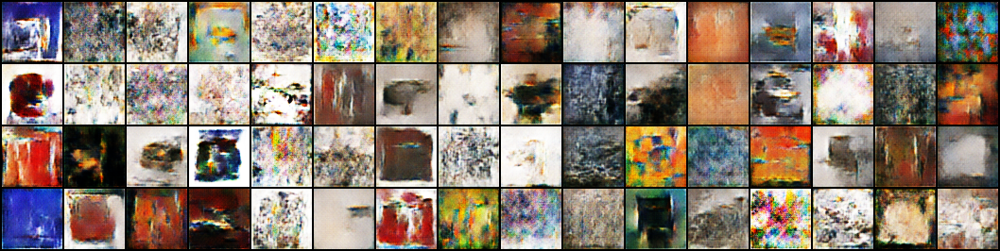

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0300.png')

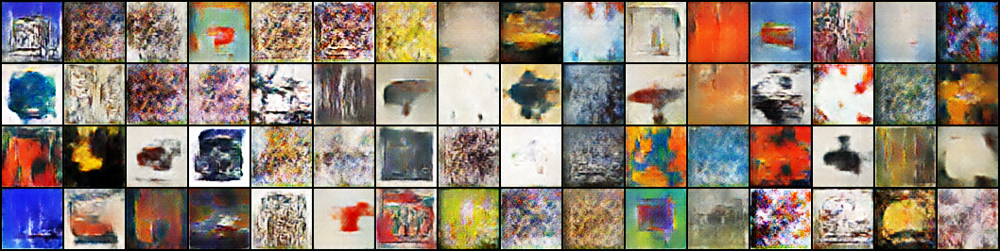

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0400.png')

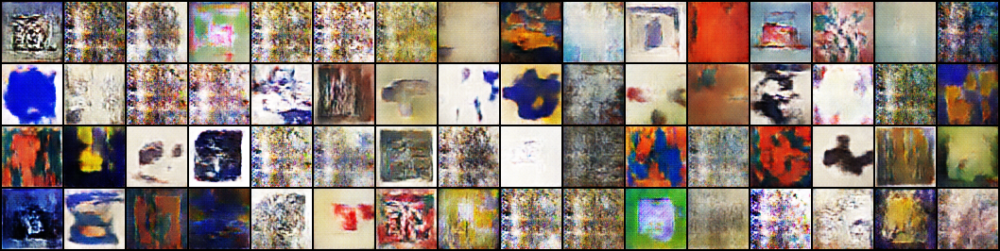

In [ ]:
from IPython.display import Image

Image('./generated/generated-images-0500.png')

In [ ]:
import zipfile

def zip_folder(folder_path, output_zip):
    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                # Create the complete file path
                file_path = os.path.join(root, file)
                # Write the file to the zip file, preserving the folder structure
                arcname = os.path.relpath(file_path, folder_path)
                zipf.write(file_path, arcname)
    print(f"Created ZIP file: {output_zip}")

# Define the folder and output ZIP file name
folder_name = 'generated'
output_zip_name = 'Generated_images.zip'

# Call the function
zip_folder(folder_name, output_zip_name)

Created ZIP file: Generated_images.zip
